# Install Library

[RDKit ](https://github.com/rdkit/rdkit)

[DGL](https://github.com/dmlc/dgl/)

[DGL-LifeSci](https://github.com/awslabs/dgl-lifesci)





In [1]:
%%capture
%pip install rdkit-pypi
%pip install dgllife
%pip install --pre dgl-cu113 dglgo -f https://data.dgl.ai/wheels-test/repo.html

# Import Library

In [3]:
import dgl 
import torch
import random
import cv2
import torchvision
import pandas as pd
import numpy as np
import tensorflow as tf
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.optim as optim

from dgllife.data import SIDER 
from numpy import array
from numpy import argmax
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import  History
from dgllife.utils import smiles_to_bigraph, CanonicalAtomFeaturizer, AttentiveFPAtomFeaturizer
from torch.utils.data import DataLoader, Dataset
from tqdm.notebook import tqdm, trange
from sklearn.model_selection import train_test_split

from utils.general import DATASET, get_dataset, separate_active_and_inactive_data
from utils.general import  get_embedding_vector_class, count_lablel,data_generator
from utils.gcn_pre_trained import get_sider_model

from Models.heterogeneous_siamese_sider import siamese_model_attentiveFp_sider, siamese_model_Canonical_sider


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Data

In [4]:
cache_path='./sider_dglgraph.bin'

df = get_dataset("sider")

Extracting file to C:\Users\User\.dgl/sider


In [5]:
sider_tasks = df.columns.values[1:].tolist()

In [6]:
from collections import Counter

one = []
zero = []

for task in sider_tasks:
  data = df[task]
  print(task ,":" ,Counter(data))
  zero.append(Counter(data)[0])
  one.append(Counter(data)[1])

Hepatobiliary disorders : Counter({1: 743, 0: 684})
Metabolism and nutrition disorders : Counter({1: 996, 0: 431})
Product issues : Counter({0: 1405, 1: 22})
Eye disorders : Counter({1: 876, 0: 551})
Investigations : Counter({1: 1151, 0: 276})
Musculoskeletal and connective tissue disorders : Counter({1: 997, 0: 430})
Gastrointestinal disorders : Counter({1: 1298, 0: 129})
Social circumstances : Counter({0: 1176, 1: 251})
Immune system disorders : Counter({1: 1024, 0: 403})
Reproductive system and breast disorders : Counter({1: 727, 0: 700})
Neoplasms benign, malignant and unspecified (incl cysts and polyps) : Counter({0: 1051, 1: 376})
General disorders and administration site conditions : Counter({1: 1292, 0: 135})
Endocrine disorders : Counter({0: 1104, 1: 323})
Surgical and medical procedures : Counter({0: 1214, 1: 213})
Vascular disorders : Counter({1: 1108, 0: 319})
Blood and lymphatic system disorders : Counter({1: 885, 0: 542})
Skin and subcutaneous tissue disorders : Counter({

In [7]:
sum(one), sum(zero)

(21868, 16661)

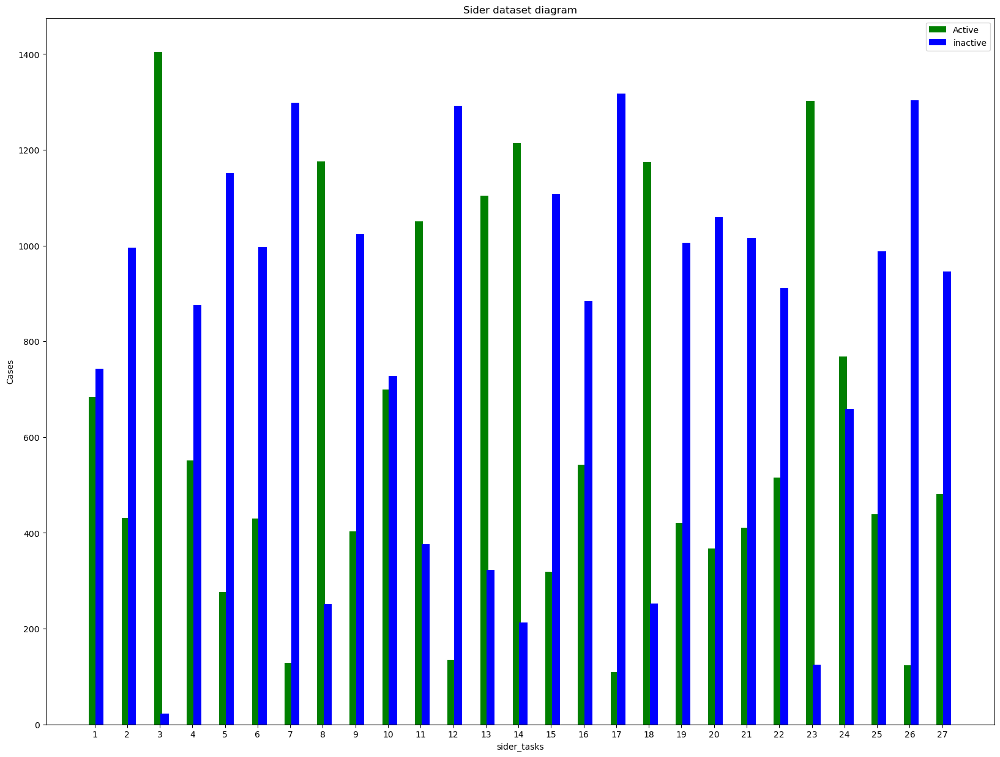

In [8]:
# Importing the matplotlib library
import numpy as np
import matplotlib.pyplot as plt
# Declaring the figure or the plot (y, x) or (width, height)
plt.figure(figsize=[20, 15])
# Data to be plotted
X = np.arange(1,len(sider_tasks)+1)

plt.bar(X + 0.20, zero, color = 'g', width = 0.25)
plt.bar(X + 0.4, one, color = 'b', width = 0.25)
# Creating the legend of the bars in the plot
plt.legend(['Active' , 'inactive' ])
# Overiding the x axis with the country names
plt.xticks([i + 0.25 for i in range(1,28)], X)
# Giving the tilte for the plot
plt.title("Sider dataset diagram")
# Namimg the x and y axis
plt.xlabel('sider_tasks')
plt.ylabel('Cases')
# Saving the plot as a 'png'
plt.savefig('4BarPlot.png')
# Displaying the bar plot
plt.show()

# Required functions

In [9]:
from dgllife.model import MLPPredictor

def create_dataset_with_gcn(dataset, class_embed_vector, GCN, tasks ):
    created_data = []
    data = np.arange(len(tasks))
    onehot_encoded = to_categorical(data)
    for i, data in enumerate(dataset):
        smiles, g, labels, mask = data
        g = g.to(device)
        g = dgl.add_self_loop(g)
        graph_feats = g.ndata.pop('h')
        embbed = GCN(g, graph_feats)
        embbed = embbed.to('cpu')
        embbed = embbed.detach().numpy()
        for j, label in enumerate(labels):
            a = (embbed, onehot_encoded[j], class_embed_vector[j], label, j , tasks[j])
            created_data.append(a)
    print('Data created!!')
    return created_data

# Calculation of embedded vectors for each class

In [10]:
df_positive, df_negative = separate_active_and_inactive_data(df, sider_tasks)

for i,d in enumerate(zip(df_positive,df_negative)):
    print(f'{sider_tasks[i]}=> positive: {len(d[0])} - negative: {len(d[1])}')

Hepatobiliary disorders=> positive: 743 - negative: 684
Metabolism and nutrition disorders=> positive: 996 - negative: 431
Product issues=> positive: 22 - negative: 1405
Eye disorders=> positive: 876 - negative: 551
Investigations=> positive: 1151 - negative: 276
Musculoskeletal and connective tissue disorders=> positive: 997 - negative: 430
Gastrointestinal disorders=> positive: 1298 - negative: 129
Social circumstances=> positive: 251 - negative: 1176
Immune system disorders=> positive: 1024 - negative: 403
Reproductive system and breast disorders=> positive: 727 - negative: 700
Neoplasms benign, malignant and unspecified (incl cysts and polyps)=> positive: 376 - negative: 1051
General disorders and administration site conditions=> positive: 1292 - negative: 135
Endocrine disorders=> positive: 323 - negative: 1104
Surgical and medical procedures=> positive: 213 - negative: 1214
Vascular disorders=> positive: 1108 - negative: 319
Blood and lymphatic system disorders=> positive: 885 - 

In [11]:
dataset_positive = [DATASET(d,smiles_to_bigraph, AttentiveFPAtomFeaturizer(), cache_file_path = cache_path) for d in df_positive]
dataset_negative = [DATASET(d,smiles_to_bigraph, AttentiveFPAtomFeaturizer(), cache_file_path = cache_path) for d in df_negative]

Processing dgl graphs from scratch...


Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1151
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1298
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1024
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1292
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1108
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1318
Processing dgl graphs from scratch...
Processing dgl graphs from scratch...
Processing molecule 1000/1006
Processing dgl graphs from scratch...
Processing molecule 1000/1060
Processing dgl graphs from scratch...


In [12]:
embed_class_sider = get_embedding_vector_class(dataset_positive, dataset_negative, radius=2, size = 512)

class vector created!!


# Classification with BioAct-Het and AttentiveFp GCN

In [13]:
model_name = 'GCN_attentivefp_SIDER'
gcn_model = get_sider_model(model_name)
gcn_model.eval()
gcn_model = gcn_model.to(device)

GCN_attentivefp_SIDER_pre_trained.pth: 100%|██████████| 3.09M/3.09M [00:00<00:00, 8.78MB/s]


Pretrained model loaded


In [14]:
dataset = DATASET(df,smiles_to_bigraph, AttentiveFPAtomFeaturizer(), cache_file_path = cache_path) 
data_ds = create_dataset_with_gcn(dataset, embed_class_sider, gcn_model, sider_tasks)

Processing dgl graphs from scratch...
Processing molecule 1000/1427
Data created!!


In [15]:
data_ds

[(array([[ 0.95081866,  0.8657737 ,  2.0994794 , ..., -0.43701488,
           0.7293868 , -0.5585575 ]], dtype=float32),
  array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32),
  array([ 3.17217035e-01, -7.46714203e-02,  1.40383028e-01,  2.27391507e-01,
          8.82147766e-02,  6.10304905e-01,  1.26648707e+00, -1.79055550e-01,
         -5.77629348e-03,  5.90873601e-01, -4.82460196e-02, -4.93958365e-02,
         -2.86598575e-02,  1.14325919e-03,  6.90309676e-01,  1.40393636e-01,
          8.42908252e-02, -1.04228345e-01,  1.90399600e-02,  2.93275301e-01,
         -3.60279959e-01,  6.98835074e-01, -1.28635251e+00,  6.82560549e-01,
          7.92356380e-01, -4.68237207e-01, -8.27124829e-02, -1.27149567e-01,
         -2.41784480e-01,  7.17880478e-01,  4.47643321e-01,  2.73878294e-01,
          1.53618184e-01,  7.20091086e-02, -1.13484876e-01, -4.27527933e-01,
          1.00537066e-01,  1.30169720e-01, 

In [16]:
from sklearn.model_selection import KFold

Epoch_S = 5

def evaluate_model(df, k = 1 , shuffle = False):
    
    result = [] 
    s = 0

    kf = KFold(n_splits= 2, shuffle= shuffle, random_state=None)
    
    for train_index, test_index in kf.split(df):

        global train_ds
        global valid_ds

        train_ds = [df[index] for index in train_index] 
        
        valid_ds = [df[index] for index in test_index]
        
        label_pos , label_neg , l11 , l22 = count_lablel(train_ds)
        print(f'train positive label: {label_pos} - train negative label: {label_neg}')

        label_pos , label_neg ,l11 , l22 = count_lablel(valid_ds)
        print(f'Test positive label: {label_pos} - Test negative label: {label_neg}')

        l_train = []
        r_train = []
        lbls_train = []
        l_valid = []
        r_valid = []
        lbls_valid = []

        for i , data in enumerate(train_ds):
            #print(data)
            embbed_drug, onehot_task, embbed_task, lbl, tnsr,task_name = data
            l_train.append(embbed_drug[0])
            r_train.append(embbed_task)
            lbls_train.append(lbl.tolist())
        
        for i , data in enumerate(valid_ds):
            embbed_drug, onehot_task, embbed_task, lbl, tnsr,task_name = data
            l_valid.append(embbed_drug[0])
            r_valid.append(embbed_task)
            lbls_valid.append(lbl.tolist())

        l_train = np.array(l_train).reshape(-1,1024,1)
        r_train = np.array(r_train).reshape(-1,512,1)
        lbls_train = np.array(lbls_train)

        l_valid = np.array(l_valid).reshape(-1,1024,1)
        r_valid = np.array(r_valid).reshape(-1,512,1)
        lbls_valid = np.array(lbls_valid)

        # create neural network model
        siamese_net = siamese_model_attentiveFp_sider()
        history = History()
        P = siamese_net.fit([l_train, r_train], lbls_train, epochs = Epoch_S, batch_size = 128, callbacks=[history])

        for j in range(1):
            C=1
            Before = int(P.history['accuracy'][-1]*100)
            for i in range(2,Epoch_S+1):
                if  int(P.history['accuracy'][-i]*100) == Before:
                    C=C+1
                else:
                    C+=1
                Before=int(P.history['accuracy'][-i]*100)
                print(Before)
            if C==Epoch_S:
                break
            P = siamese_net.fit([l_train, r_train], lbls_train, epochs = Epoch_S, batch_size = 128, callbacks=[history])
        print(j+1)
        
        score  = siamese_net.evaluate([l_valid,r_valid], lbls_valid, verbose=1)
        a = (score[1],score[4])
        result.append(a)
        
        if score[4] > s :
            best_model = siamese_net
            s = score[4]
            print("Save_model")
            
        
    return result , best_model

scores, best_model = evaluate_model(data_ds, 1, True)

tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(0.)
tensor(1.)
tensor(1.)
tensor(1.)
tensor(1.)

In [17]:
best_model.save("Model.h5")

c:\Users\User\anaconda3\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [53]:
l_train = []
r_train = []
lbls_train = []
task_number_train = []

l_valid = []
r_valid = []
lbls_valid = []
task_namber_test = []

index = []

for i , data in enumerate(train_ds):
    embbed_drug, onehot_task, embbed_task, lbl, task_number, task_name = data
    if lbl == 1.:
        l_train.append(embbed_drug[0])
        r_train.append(embbed_task)
        lbls_train.append(lbl.tolist())
        index.append(i)
        task_number_train.append(task_number)


for i, data in enumerate(valid_ds):
    embbed_drug, onehot_task, embbed_task, lbl, task_number, task_name = data
    if lbl == 1.:   
        l_valid.append(embbed_drug[0])
        r_valid.append(embbed_task)
        lbls_valid.append(lbl.tolist())
        task_namber_test.append(task_number)

l_train = np.array(l_train).reshape(-1,1024,1)
r_train = np.array(r_train).reshape(-1,512,1)
lbls_train = np.array(lbls_train)

l_valid = np.array(l_valid).reshape(-1,1024,1)
r_valid = np.array(r_valid).reshape(-1,512,1)
lbls_valid = np.array(lbls_valid)

In [57]:
print(len(index))
print(index[0])

10904
2


In [19]:
model = siamese_model_attentiveFp_sider ()

# Train the siamese model with your training data

# Create a new Keras model that outputs the output of the L1 layer in the siamese model
L1_model = tf.keras.Model(inputs=model.inputs,
                          outputs=model.layers[5].output)

# Get the output of the L1 layer for the test data
before_training_L1_output_valid = L1_model.predict([l_valid, r_valid])
before_training_L1_output_train = L1_model.predict([l_train, r_train])

341/341 [==============================] - 3s 9ms/step


In [20]:
# Train the siamese model with your training data

# Create a new Keras model that outputs the output of the L1 layer in the siamese model
L1_model = tf.keras.Model(inputs=best_model.inputs,
                          outputs=best_model.layers[5].output)

# Get the output of the L1 layer for the test data
after_training_L1_output_valid = L1_model.predict([l_valid, r_valid])
after_training_L1_output_train = L1_model.predict([l_train, r_train])
print(after_training_L1_output_train)

341/341 [==============================] - 4s 10ms/step
[[ 0.          0.0462338   0.         ...  0.          0.
   1.2436436 ]
 [ 0.          0.0462338   0.         ...  0.          0.
   1.0097321 ]
 [ 0.          0.0462338   0.         ...  0.          0.
   6.6261477 ]
 ...
 [ 0.          3.49816     0.         ...  6.830825   10.21737
   0.        ]
 [ 0.          7.814703    0.         ...  6.830825    0.
   2.0183794 ]
 [ 0.          7.814703    0.         ...  6.830825    0.
   0.88146865]]


### T-SNE Visualization n_components = 3 

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10904 samples in 0.007s...
[t-SNE] Computed neighbors for 10904 samples in 2.338s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10904
[t-SNE] Computed conditional probabilities for sample 2000 / 10904
[t-SNE] Computed conditional probabilities for sample 3000 / 10904
[t-SNE] Computed conditional probabilities for sample 4000 / 10904
[t-SNE] Computed conditional probabilities for sample 5000 / 10904
[t-SNE] Computed conditional probabilities for sample 6000 / 10904
[t-SNE] Computed conditional probabilities for sample 7000 / 10904
[t-SNE] Computed conditional probabilities for sample 8000 / 10904
[t-SNE] Computed conditional probabilities for sample 9000 / 10904
[t-SNE] Computed conditional probabilities for sample 10000 / 10904
[t-SNE] Computed conditional probabilities for sample 10904 / 10904
[t-SNE] Mean sigma: 0.604757
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.381027
[t-SNE] KL 

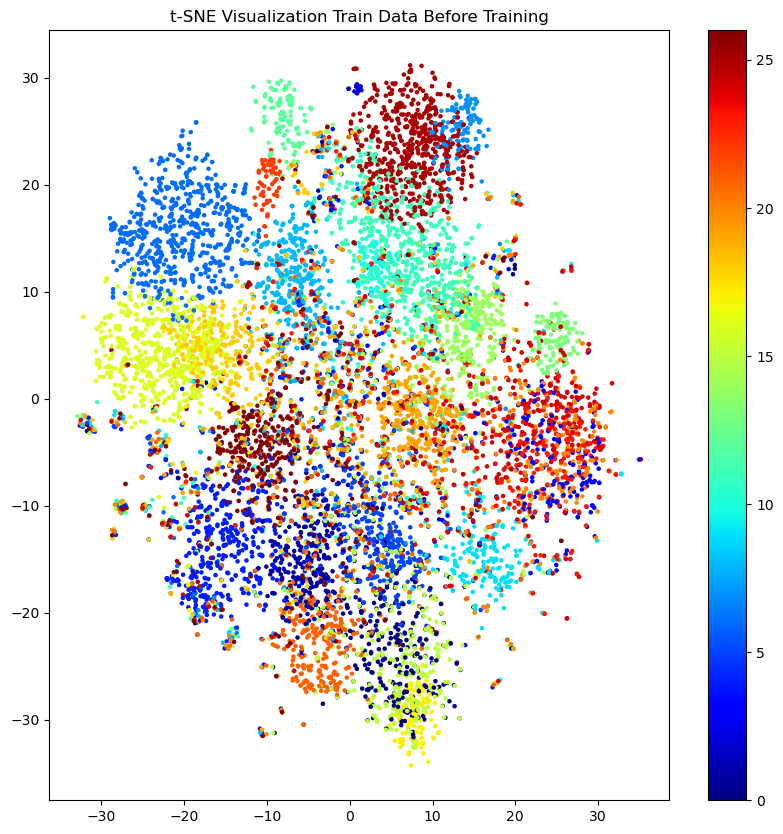

In [21]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Load your data
data = before_training_L1_output_train.copy()  # Replace this with your actual data
labels = task_number_train.copy()

# Define the t-SNE model with default parameters
tsne = TSNE(n_components=3, init='random', learning_rate=200.0, verbose=1)

# Fit and transform the data to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Plot the t-SNE results
plt.figure(figsize=(10, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='jet', s=5)
plt.colorbar()
plt.title('t-SNE Visualization Train Data Before Training')
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10904 samples in 0.002s...
[t-SNE] Computed neighbors for 10904 samples in 1.283s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10904
[t-SNE] Computed conditional probabilities for sample 2000 / 10904
[t-SNE] Computed conditional probabilities for sample 3000 / 10904
[t-SNE] Computed conditional probabilities for sample 4000 / 10904
[t-SNE] Computed conditional probabilities for sample 5000 / 10904
[t-SNE] Computed conditional probabilities for sample 6000 / 10904
[t-SNE] Computed conditional probabilities for sample 7000 / 10904
[t-SNE] Computed conditional probabilities for sample 8000 / 10904
[t-SNE] Computed conditional probabilities for sample 9000 / 10904
[t-SNE] Computed conditional probabilities for sample 10000 / 10904
[t-SNE] Computed conditional probabilities for sample 10904 / 10904
[t-SNE] Mean sigma: 1.912683
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.972092
[t-SNE] KL 

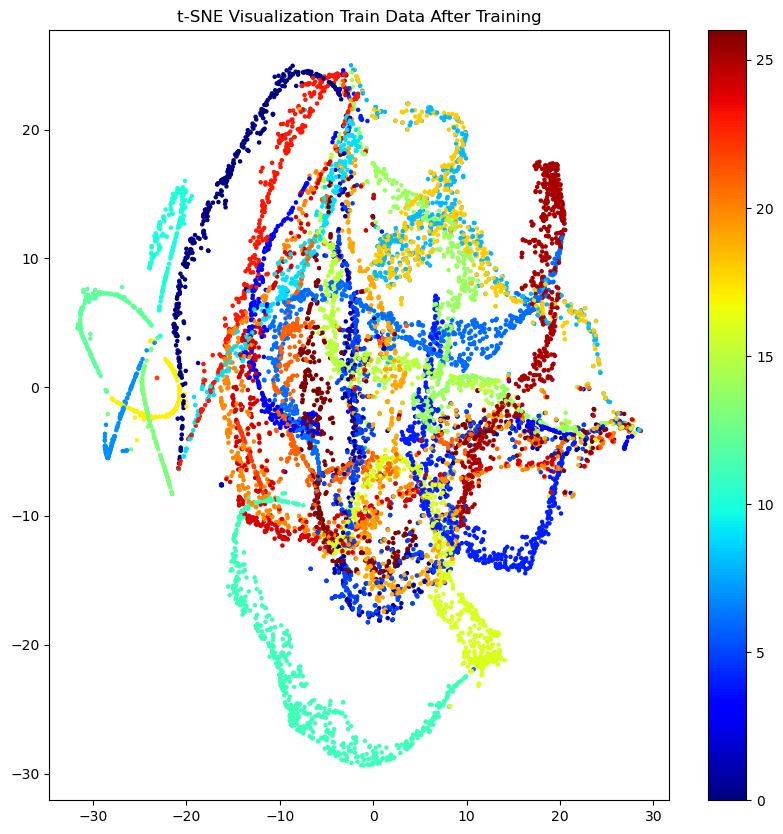

In [22]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Load your data
data = after_training_L1_output_train.copy()  # Replace this with your actual data
labels = task_number_train.copy()

# Define the t-SNE model with default parameters
tsne = TSNE(n_components=3, init='random', learning_rate=200.0, verbose=1)

# Fit and transform the data to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Plot the t-SNE results
plt.figure(figsize=(10, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='jet', s=5)
plt.colorbar()
plt.title('t-SNE Visualization Train Data After Training')
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10964 samples in 0.002s...
[t-SNE] Computed neighbors for 10964 samples in 1.706s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10964
[t-SNE] Computed conditional probabilities for sample 2000 / 10964
[t-SNE] Computed conditional probabilities for sample 3000 / 10964
[t-SNE] Computed conditional probabilities for sample 4000 / 10964
[t-SNE] Computed conditional probabilities for sample 5000 / 10964
[t-SNE] Computed conditional probabilities for sample 6000 / 10964
[t-SNE] Computed conditional probabilities for sample 7000 / 10964
[t-SNE] Computed conditional probabilities for sample 8000 / 10964
[t-SNE] Computed conditional probabilities for sample 9000 / 10964
[t-SNE] Computed conditional probabilities for sample 10000 / 10964
[t-SNE] Computed conditional probabilities for sample 10964 / 10964
[t-SNE] Mean sigma: 0.600246
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.886803
[t-SNE] KL 

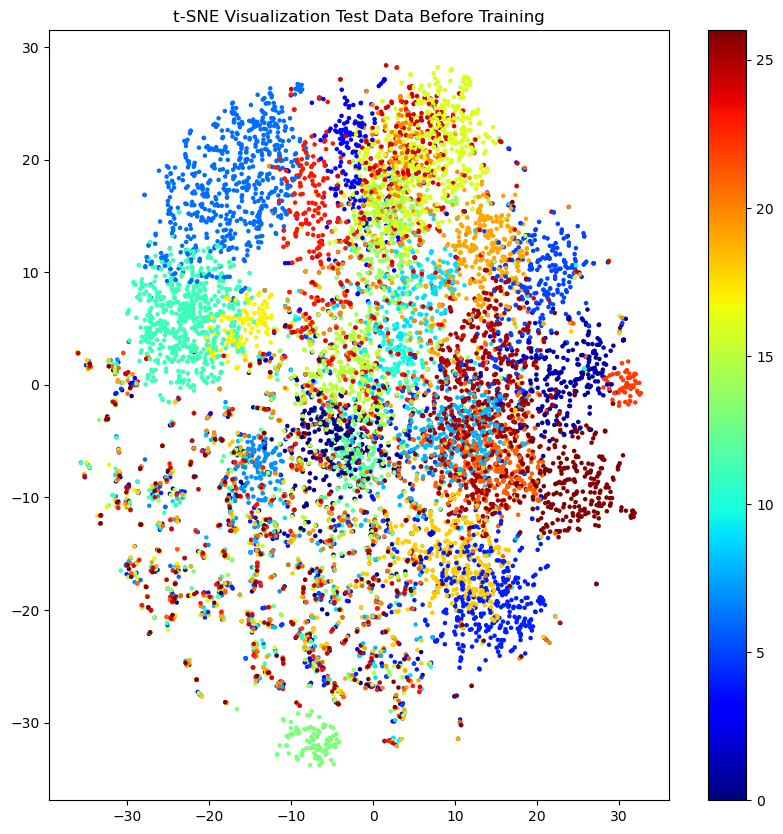

In [23]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Load your data
data = before_training_L1_output_valid.copy()  # Replace this with your actual data
labels = task_namber_test.copy()

# Define the t-SNE model with default parameters
tsne = TSNE(n_components=3, init='random', learning_rate=200.0, verbose=1)

# Fit and transform the data to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Plot the t-SNE results
plt.figure(figsize=(10, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='jet', s=5)
plt.colorbar()
plt.title('t-SNE Visualization Test Data Before Training')
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10964 samples in 0.003s...
[t-SNE] Computed neighbors for 10964 samples in 1.145s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10964
[t-SNE] Computed conditional probabilities for sample 2000 / 10964
[t-SNE] Computed conditional probabilities for sample 3000 / 10964
[t-SNE] Computed conditional probabilities for sample 4000 / 10964
[t-SNE] Computed conditional probabilities for sample 5000 / 10964
[t-SNE] Computed conditional probabilities for sample 6000 / 10964
[t-SNE] Computed conditional probabilities for sample 7000 / 10964
[t-SNE] Computed conditional probabilities for sample 8000 / 10964
[t-SNE] Computed conditional probabilities for sample 9000 / 10964
[t-SNE] Computed conditional probabilities for sample 10000 / 10964
[t-SNE] Computed conditional probabilities for sample 10964 / 10964
[t-SNE] Mean sigma: 1.922275
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.108025
[t-SNE] KL 

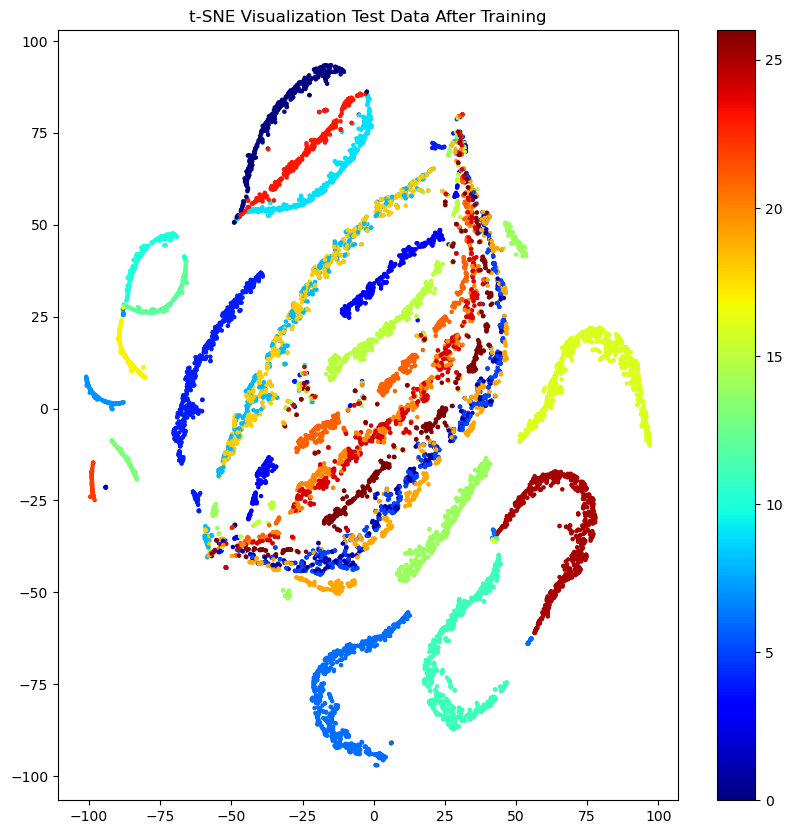

In [24]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Load your data
data = after_training_L1_output_valid.copy()  # Replace this with your actual data
labels = task_namber_test.copy()

# Define the t-SNE model with default parameters
tsne = TSNE(n_components=2, init='random', learning_rate=200.0, verbose=1)

# Fit and transform the data to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Plot the t-SNE results
plt.figure(figsize=(10, 10))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=labels, cmap='jet', s=5)
plt.colorbar()
plt.title('t-SNE Visualization Test Data After Training')
plt.show()

### radius = 2, size = 512,  epochs = 10, bach = 128

In [25]:
scores

[(0.8052945733070374, 0.8864410519599915),
 (0.8011316657066345, 0.8825826644897461)]

In [26]:
acc = []
auc = []
for i in scores:
    acc.append(i[0])
    auc.append(i[1])
print(f'accuracy= {np.mean(acc)} AUC= {np.mean(auc)}')

accuracy= 0.8032131195068359 AUC= 0.8845118582248688


# Classification with BioAct-Het and Canonical GCN 

In [27]:
model_name = 'GCN_canonical_SIDER'
gcn_model = get_sider_model(model_name)
gcn_model.eval()
gcn_model = gcn_model.to(device)

GCN_canonical_SIDER_pre_trained.pth: 100%|██████████| 2.35M/2.35M [00:01<00:00, 1.59MB/s]

Pretrained model loaded


In [ ]:
dataset = DATASET(df,smiles_to_bigraph, CanonicalAtomFeaturizer(), cache_file_path = cache_path) 
data_ds = create_dataset_with_gcn(dataset, embed_class_sider, gcn_model, sider_tasks)

Processing dgl graphs from scratch...
Processing molecule 1000/1427
Data created!!


In [ ]:
from sklearn.model_selection import KFold

Epoch_S = 10

def evaluate_model(df, k = 10 , shuffle = False):
    result =[]    

    kf = KFold(n_splits=10, shuffle= shuffle, random_state=None)
    
    for train_index, test_index in kf.split(df):

        train_ds = [df[index] for index in train_index] 
        
        valid_ds = [df[index] for index in test_index] 
        
        label_pos , label_neg = count_lablel(train_ds)
        print(f'train positive label: {label_pos} - train negative label: {label_neg}')

        label_pos , label_neg = count_lablel(valid_ds)
        print(f'Test positive label: {label_pos} - Test negative label: {label_neg}')

        l_train = []
        r_train = []
        lbls_train = []
        l_valid = []
        r_valid = []
        lbls_valid = []

        index_l = []
        index_r = []

        for i , data in enumerate(train_ds):
            embbed_drug, onehot_task, embbed_task, lbl, task_name = data
            l_train.append(embbed_drug[0])
            r_train.append(embbed_task)
            index_l.append(i)
            lbls_train.append(lbl.tolist())
        
        for i , data in enumerate(valid_ds):
            embbed_drug, onehot_task, embbed_task, lbl, task_name = data
            l_valid.append(embbed_drug[0])
            r_valid.append(embbed_task)
            index_r.append(i)
            lbls_valid.append(lbl.tolist())

        l_train = np.array(l_train).reshape(-1,512,1)
        r_train = np.array(r_train).reshape(-1,512,1)
        lbls_train = np.array(lbls_train)

        l_valid = np.array(l_valid).reshape(-1,512,1)
        r_valid = np.array(r_valid).reshape(-1,512,1)
        lbls_valid = np.array(lbls_valid)

        # create neural network model
        siamese_net = siamese_model_Canonical_sider()
        history = History()
        P = siamese_net.fit([l_train, r_train], lbls_train, epochs = Epoch_S, batch_size=64, callbacks=[history])

        for j in range(100):
            C=1
            Before = int(P.history['accuracy'][-1]*100)
            for i in range(2,Epoch_S+1):
                if  int(P.history['accuracy'][-i]*100)== Before:
                    C=C+1
                else:
                    C=1
                Before=int(P.history['accuracy'][-i]*100)
                print(Before)
            if C==Epoch_S:
                break
            P = siamese_net.fit([l_train, r_train], lbls_train, epochs = Epoch_S, batch_size=64, callbacks=[history])

        print(j+1)
        
        score  = siamese_net.evaluate([l_valid,r_valid],lbls_valid, verbose=1)
        a = (score[1],score[4])
        result.append(a)
    
    return result
 

scores = evaluate_model(data_ds, 10, True)

train positive label: 19677 - train negative label: 14999
Test positive label: 2191 - Test negative label: 1662
Epoch 1/10
542/542 [==============================] - 3s 5ms/step - loss: 0.5389 - accuracy: 0.7422 - mae: 0.3600 - mse: 0.1792 - auc_10: 0.7944
Epoch 2/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4938 - accuracy: 0.7732 - mae: 0.3237 - mse: 0.1613 - auc_10: 0.8356
Epoch 3/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4832 - accuracy: 0.7794 - mae: 0.3170 - mse: 0.1576 - auc_10: 0.8430
Epoch 4/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4787 - accuracy: 0.7785 - mae: 0.3133 - mse: 0.1560 - auc_10: 0.8461
Epoch 5/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4733 - accuracy: 0.7820 - mae: 0.3099 - mse: 0.1538 - auc_10: 0.8505
Epoch 6/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4696 - accuracy: 0.7834 - mae: 0.3066 - mse: 0.1526 - auc_10: 0.8530
Epoch 7/10
542/542

542/542 [==============================] - 2s 4ms/step - loss: 0.4762 - accuracy: 0.7794 - mae: 0.3113 - mse: 0.1550 - auc_12: 0.8492
Epoch 5/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4705 - accuracy: 0.7835 - mae: 0.3071 - mse: 0.1527 - auc_12: 0.8534
Epoch 6/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4673 - accuracy: 0.7840 - mae: 0.3048 - mse: 0.1514 - auc_12: 0.8559
Epoch 7/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4626 - accuracy: 0.7847 - mae: 0.3017 - mse: 0.1501 - auc_12: 0.8587
Epoch 8/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4595 - accuracy: 0.7881 - mae: 0.2997 - mse: 0.1489 - auc_12: 0.8611
Epoch 9/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4578 - accuracy: 0.7900 - mae: 0.2978 - mse: 0.1481 - auc_12: 0.8624
Epoch 10/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4538 - accuracy: 0.7913 - mae: 0.2949 - mse: 0.1468 - auc_12: 0.

542/542 [==============================] - 2s 4ms/step - loss: 0.4532 - accuracy: 0.7925 - mae: 0.2953 - mse: 0.1467 - auc_14: 0.8649
78
78
78
78
78
77
77
77
74
Epoch 1/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4509 - accuracy: 0.7935 - mae: 0.2931 - mse: 0.1455 - auc_14: 0.8670
Epoch 2/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4478 - accuracy: 0.7920 - mae: 0.2917 - mse: 0.1448 - auc_14: 0.8687
Epoch 3/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4453 - accuracy: 0.7934 - mae: 0.2895 - mse: 0.1438 - auc_14: 0.8705
Epoch 4/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4402 - accuracy: 0.7965 - mae: 0.2860 - mse: 0.1419 - auc_14: 0.8739
Epoch 5/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4379 - accuracy: 0.7982 - mae: 0.2841 - mse: 0.1412 - auc_14: 0.8752
Epoch 6/10
542/542 [==============================] - 2s 4ms/step - loss: 0.4362 - accuracy: 0.7973 - mae: 0.2835 

542/542 [==============================] - 3s 5ms/step - loss: 0.4684 - accuracy: 0.7846 - mae: 0.3060 - mse: 0.1520 - auc_16: 0.8550
Epoch 7/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4648 - accuracy: 0.7881 - mae: 0.3026 - mse: 0.1507 - auc_16: 0.8573
Epoch 8/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4605 - accuracy: 0.7888 - mae: 0.3001 - mse: 0.1490 - auc_16: 0.8603
Epoch 9/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4567 - accuracy: 0.7920 - mae: 0.2977 - mse: 0.1476 - auc_16: 0.8631
Epoch 10/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4539 - accuracy: 0.7916 - mae: 0.2948 - mse: 0.1465 - auc_16: 0.8652
79
78
78
78
78
77
77
77
74
Epoch 1/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4505 - accuracy: 0.7946 - mae: 0.2924 - mse: 0.1452 - auc_16: 0.8676
Epoch 2/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4470 - accuracy: 0.7957 - mae: 0.2903

542/542 [==============================] - 3s 5ms/step - loss: 0.4409 - accuracy: 0.7961 - mae: 0.2861 - mse: 0.1426 - auc_17: 0.8725
Epoch 5/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4375 - accuracy: 0.7997 - mae: 0.2829 - mse: 0.1407 - auc_17: 0.8755
Epoch 6/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4336 - accuracy: 0.8019 - mae: 0.2806 - mse: 0.1393 - auc_17: 0.8780
Epoch 7/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4337 - accuracy: 0.8015 - mae: 0.2801 - mse: 0.1394 - auc_17: 0.8778
Epoch 8/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4301 - accuracy: 0.8007 - mae: 0.2785 - mse: 0.1382 - auc_17: 0.8802
Epoch 9/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4258 - accuracy: 0.8054 - mae: 0.2750 - mse: 0.1368 - auc_17: 0.8825
Epoch 10/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4240 - accuracy: 0.8056 - mae: 0.2734 - mse: 0.1363 - auc_17: 0.

542/542 [==============================] - 3s 5ms/step - loss: 0.4243 - accuracy: 0.8065 - mae: 0.2740 - mse: 0.1360 - auc_19: 0.8841
80
80
80
80
80
79
79
79
79
Epoch 1/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4192 - accuracy: 0.8082 - mae: 0.2705 - mse: 0.1344 - auc_19: 0.8868
Epoch 2/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4171 - accuracy: 0.8097 - mae: 0.2695 - mse: 0.1336 - auc_19: 0.8881
Epoch 3/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4149 - accuracy: 0.8096 - mae: 0.2678 - mse: 0.1332 - auc_19: 0.8888
Epoch 4/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4128 - accuracy: 0.8109 - mae: 0.2660 - mse: 0.1322 - auc_19: 0.8904
Epoch 5/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4098 - accuracy: 0.8111 - mae: 0.2639 - mse: 0.1313 - auc_19: 0.8922
Epoch 6/10
542/542 [==============================] - 3s 5ms/step - loss: 0.4111 - accuracy: 0.8116 - mae: 0.2656 

In [ ]:
scores

[(0.8071632385253906, 0.8935203552246094),
 (0.8211783170700073, 0.9038162231445312),
 (0.8157280087471008, 0.9006925821304321),
 (0.8188424706459045, 0.8998231887817383),
 (0.8258500099182129, 0.9142937660217285),
 (0.8214378356933594, 0.9023292064666748),
 (0.8214378356933594, 0.9078352451324463),
 (0.8261095285415649, 0.9032749533653259),
 (0.8172852396965027, 0.9035115838050842),
 (0.8250259757041931, 0.905881941318512)]

In [ ]:
acc = []
auc = []
for i in scores:
    acc.append(i[0])
    auc.append(i[1])
print(f'accuracy= {np.mean(acc)} AUC= {np.mean(auc)}')

accuracy= 0.8200058460235595 AUC= 0.9034979045391083


In [29]:
from tensorflow.keras.models import load_model

model = load_model('Model.h5')
result = (model.predict([l_train, r_train]))

341/341 [==============================] - 3s 7ms/step


In [38]:
d = pd.read_csv("Data/sider.csv")
print(d.columns)
print(len(d.columns))


Index(['Unnamed: 0', 'smiles', 'Hepatobiliary disorders',
       'Metabolism and nutrition disorders', 'Product issues', 'Eye disorders',
       'Investigations', 'Musculoskeletal and connective tissue disorders',
       'Gastrointestinal disorders', 'Social circumstances',
       'Immune system disorders', 'Reproductive system and breast disorders',
       'Neoplasms benign, malignant and unspecified (incl cysts and polyps)',
       'General disorders and administration site conditions',
       'Endocrine disorders', 'Surgical and medical procedures',
       'Vascular disorders', 'Blood and lymphatic system disorders',
       'Skin and subcutaneous tissue disorders',
       'Congenital, familial and genetic disorders',
       'Infections and infestations',
       'Respiratory, thoracic and mediastinal disorders',
       'Psychiatric disorders', 'Renal and urinary disorders',
       'Pregnancy, puerperium and perinatal conditions',
       'Ear and labyrinth disorders', 'Cardiac disorde

In [44]:
print(len(l_train[0]))
#print(lbls_train[0],lbls_train[1],lbls_train[2])
print(l_train[0][0], r_train[0][0])
print(l_train[0][1], r_train[0][1])
print(l_train[0][2], r_train[0][2])
print(l_train[0][3], r_train[0][3])
print(l_train[0][4], r_train[0][4])

print(len(l_train))
print(len(result[0]))


print(len(result[1]))

1024
[0.95081866] [0.24596582]
[0.8657737] [0.23564549]
[2.0994794] [0.18142184]
[1.155286] [0.53555266]
[0.3202413] [0.35923673]
10904
1
1


In [46]:
correct_pred = 0
for i in range(len(result)):
    if (result[i] >= 0.5):
        correct_pred+=1
    print(lbls_train[i], "   ",result[i])

1.0     [0.58450866]
1.0     [0.732497]
1.0     [0.74658257]
1.0     [0.7452427]
1.0     [0.49493405]
1.0     [0.47254527]
1.0     [0.33561563]
1.0     [0.47503367]
1.0     [0.7160518]
1.0     [0.5226874]
1.0     [0.47481328]
1.0     [0.70156235]
1.0     [0.5162592]
1.0     [0.4746955]
1.0     [0.31246534]
1.0     [0.68037874]
1.0     [0.4807672]
1.0     [0.5477953]
1.0     [0.713829]
1.0     [0.51953006]
1.0     [0.19912848]
1.0     [0.72939336]
1.0     [0.68867165]
1.0     [0.65340555]
1.0     [0.4195778]
1.0     [0.23463745]
1.0     [0.11069275]
1.0     [0.69475603]
1.0     [0.8719014]
1.0     [0.16586122]
1.0     [0.6617948]
1.0     [0.65870845]
1.0     [0.61930794]
1.0     [0.60081106]
1.0     [0.62141925]
1.0     [0.71940744]
1.0     [0.84947693]
1.0     [0.9408997]
1.0     [0.9784366]
1.0     [0.90263796]
1.0     [0.97130483]
1.0     [0.9221987]
1.0     [0.8370099]
1.0     [0.9725557]
1.0     [0.66213006]
1.0     [0.6602383]
1.0     [0.7574842]
1.0     [0.6623991]
1.0     [0.890

[0.7353122]
1.0     [0.9026154]
1.0     [0.9735254]
1.0     [0.8471365]
1.0     [0.33399054]
1.0     [0.8771652]
1.0     [0.67687154]
1.0     [0.8962378]
1.0     [0.9747029]
1.0     [0.8896758]
1.0     [0.78662]
1.0     [0.70580816]
1.0     [0.9319203]
1.0     [0.8322991]
1.0     [0.93511826]
1.0     [0.74193406]
1.0     [0.77309656]
1.0     [0.62636006]
1.0     [0.42757636]
1.0     [0.44685793]
1.0     [0.37822235]
1.0     [0.23358555]
1.0     [0.67030096]
1.0     [0.77822745]
1.0     [0.882644]
1.0     [0.1174283]
1.0     [0.17303976]
1.0     [0.6806139]
1.0     [0.8787091]
1.0     [0.47546855]
1.0     [0.6848816]
1.0     [0.7912009]
1.0     [0.68583226]
1.0     [0.4512433]
1.0     [0.26200008]
1.0     [0.60071963]
1.0     [0.89180154]
1.0     [0.70129395]
1.0     [0.632985]
1.0     [0.8880699]
1.0     [0.6561044]
1.0     [0.76328903]
1.0     [0.8520422]
1.0     [0.9400072]
1.0     [0.77052546]
1.0     [0.81228286]
1.0     [0.71938103]
1.0     [0.9239354]
1.0     [0.73892754]
1.0    

In [48]:
print("Number of correct predictions : ",correct_pred)
print("Number of correct predictions : ",len(result)-correct_pred)

Number of correct predictions :  8940
Number of correct predictions :  1964


In [52]:
accuracy = (correct_pred / len(result)) * 100
print("Test Accuracy : ",accuracy)

Test Accuracy :  81.98826118855466


In [59]:
print(d['smiles'])

0                                         C(CNCCNCCNCCN)N
1       CC(C)(C)C1=CC(=C(C=C1NC(=O)C2=CNC3=CC=CC=C3C2=...
2       CC[C@]12CC(=C)[C@H]3[C@H]([C@@H]1CC[C@]2(C#C)O...
3         CCC12CC(=C)C3C(C1CC[C@]2(C#C)O)CCC4=CC(=O)CCC34
4                  C1C(C2=CC=CC=C2N(C3=CC=CC=C31)C(=O)N)O
                              ...                        
1422    C[C@H]1CN(CC[C@@]1(C)C2=CC(=CC=C2)O)C[C@H](CC3...
1423    CC[C@@H]1[C@@]2([C@@H]([C@@H](C(=O)[C@@H](C[C@...
1424    CCOC1=CC=C(C=C1)CC2=C(C=CC(=C2)[C@H]3[C@@H]([C...
1425    C1CN(CCC1N2C3=CC=CC=C3NC2=O)CCCC(C4=CC=C(C=C4)...
1426         CCC(=O)C(CC(C)N(C)C)(C1=CC=CC=C1)C2=CC=CC=C2
Name: smiles, Length: 1427, dtype: object


In [63]:
# Compounds that have bioactivity
for i in range(50):
    if (result[i] >= 0.5):
        print(d['smiles'][index[i]], "   ",result[i])

CC[C@]12CC(=C)[C@H]3[C@H]([C@@H]1CC[C@]2(C#C)O)CCC4=CCCC[C@H]34     [0.58450866]
CCC12CC(=C)C3C(C1CC[C@]2(C#C)O)CCC4=CC(=O)CCC34     [0.732497]
CC1CC2C3CCC4=CC(=O)C=CC4([C@]3(C(CC2([C@]1(C(=O)CCl)O)C)O)F)C     [0.74658257]
C1CC(N(C1)C(=O)C2CSSCC(C(=O)NC(C(=O)NC(C(=O)NC(C(=O)NC(C(=O)N2)CC(=O)N)CCC(=O)N)CC3=CC=CC=C3)CC4=CC=C(C=C4)O)N)C(=O)NC(CCCN=C(N)N)C(=O)NCC(=O)N     [0.7452427]
C[N+](C)(C)CC(CC(=O)O)O     [0.7160518]
C[C@H]1C[C@H]2[C@@H]3C[C@@H](C4=CC(=O)C=C[C@@]4([C@]3([C@H](C[C@@]2([C@]1(C(=O)CCl)O)C)O)F)C)F     [0.5226874]
CC[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@]2(C#C)O)CCC4=CC(=O)CC[C@H]34.C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@]2(C#C)O)CCC4=C3C=CC(=C4)O     [0.70156235]
CCCCC(=O)O[C@@]1([C@H](C[C@@H]2[C@@]1(C[C@@H]([C@]3([C@H]2CCC4=CC(=O)C=C[C@@]43C)F)O)C)C)C(=O)CO     [0.5162592]
CC(=O)O.C(C(C(C(C(C=O)O)O)O)O)O     [0.68037874]
C1=NC2=C(C(=N1)N)N=CN2C3C(C(C(O3)CO)O)O     [0.5477953]
C1=CO[C@@H]([C@H]([C@@H]1O)O)C(=O)O.Cl     [0.713829]
CCCCCC(C=CC1C(CC(=O)C1CCCCCCC(=O)O)O)O     [0.5195300